## Project 1: Accurate Numerical Solutions of the Time-dependent Schrodinger Equation

First, we define a function to get the desired coefficients for the $(2r+1)$ point formula that is used to calculate the second derivative of the wavefunction.

In [10]:
using LinearAlgebra, QuadGK, Plots, LaTeXStrings, StatsBase, SparseArrays, SuiteSparse.UMFPACK, Polynomials

function table_coeff(r::Integer)
    
    A = zeros(r,r)
    B = [i^2 for i in 1:r]
    
    for i in 1:r
        A[:,i] = (B.^i)/factorial(2*i)
    end

    A = 2*A
    b = zeros(r,(2*r)+1)

    for i in 1:r
        temp = zeros((2*r)+1)
        temp[r+1] = -2
        temp[r-i+1], temp[r+i+1] = 1, 1
        b[i,:] = temp
    end

    coeff = round.(lu(A)\b, digits=10)
    return coeff[1,r+1:end]

end

function table(r::Union{Array,Vector,UnitRange,Integer})
    
    return [table_coeff(r[i]) for i in eachindex(r)]

end;

# Performing a check
println(table(1:4))

[[-2.0, 1.0], [-2.5, 1.3333333333, -0.0833333333], [-2.7222222222, 1.5, -0.15, 0.0111111111], [-2.8472222222, 1.6, -0.2, 0.0253968254, -0.0017857143]]


### Pade Approximants

Defined below, is the function to calculate roots of the $M^{th}$ Pade Approximant

In [11]:
function Pade_roots(M::Integer)
    
    A_mat1 = spzeros(M,M)
    for i in 1:M-1
        A_mat1 += spdiagm(-i => [1/(factorial(2*j-i+1)) for j in i:M-1], i => [1/(factorial(2*j-i+1)) for j in i:M-1])
    end
    A_mat1 += spdiagm(0 => [1/(factorial(2*j-1)) for j in 1:M])

    val = [-1/factorial(M+i) for i in 1:M]

    b_vec = reverse(lu(A_mat1) \ val)

    A_mat2 = spzeros(M+1,M+1)
    for i in 1:M+1
        A_mat2 += spdiagm(-i+1 => 1/(factorial(i))*ones(ComplexF64,M-i+2))
    end
    A_mat2 += spdiagm(1 => ones(ComplexF64,M))
    new_b = ones(M+1)
    new_b[2:end] = copy(b_vec)
    new_a = ones(ComplexF64,M+1)
    new_a[2:end] = (A_mat2*new_b)[begin:M]

    return round.(roots(Polynomial(new_a)), digits=5)
    
end

function Pade_roots_table(M::Union{Array,Vector,UnitRange,Integer})
    return [Pade_roots(M[i]) for i in eachindex(M)]
end;

In [12]:
# Performing check
Pade_roots_table(3)

1-element Vector{Vector{ComplexF64}}:
 [-4.64437 + 0.0im, -3.67781 - 3.50876im, -3.67781 + 3.50876im]

In [13]:
# Checking for a range of values
pade_test = 1:4
Pade_roots_table(pade_test)

4-element Vector{Vector{ComplexF64}}:
 [-2.0 + 0.0im]
 [-3.0 + 1.73205im, -3.0 - 1.73205im]
 [-4.64437 + 0.0im, -3.67781 - 3.50876im, -3.67781 + 3.50876im]
 [-5.79242 + 1.73447im, -5.79242 - 1.73447im, -4.20758 - 5.31484im, -4.20758 + 5.31484im]

### Functions for solving the problem:

In [14]:
# Function to calculate initial wavefunction numerically at pre-defined points
function wvfn(x,R,x_0,p_0)
    return reshape(exp.(-R.*(x.-x_0).^2+1im*p_0.*x), (length(x),1))
end

# Function to return potential values, initialized to harmonic potential, definition can be edited for other potentials
function potential(x,k=1)
    return reshape(0.5*k.*(x.^2), (length(x),1))
end

# To plot probability density
function plot_density(xval, wvfn_val, wvfn_latex::LaTeXString)

    plot(xval,abs2.(wvfn_val), label=string("|$wvfn_latex|",L"^2"), lw=2, gridlinewidth=2)
    xlabel!(L"x →")
    ylabel!(string("|$wvfn_latex|",L"^2 →"))
    title!("Probability Density for $wvfn_latex")
end

# Check Normalization
function check_norm(psi_solution,a)
    density_integral = [a*(sum(abs2.(psi_solution[:,i]))) for i in 1:size(psi_solution)[2]]
    return density_integral    
end

# Solving the system
function solve_wvfn(init_wvfn, A_mat, N_t)

    N = length(init_wvfn)
    wvfn_t = spzeros(ComplexF64,N,N_t+1)

    wvfn_t[begin:end,1] = init_wvfn

    for i in 2:N_t+1
        wvfn_t[begin:end,i] = (lu(A_mat) \ (conj(A_mat)*reshape(Vector(wvfn_t[begin:end,i-1]),(N,1))))
    end
    
    return wvfn_t
end

# Animating the probability density for the solution
function plot_solution(x_in, psi_solution, t, potential::String, n_frames = 4)
    N_t = size(psi_solution)[2]-1
    anim = @animate for i in 1:N_t+1
        curr_tval = round((i-1)*t/N_t, digits = 3)
        plot(x_in, abs2.(psi_solution[begin:end,i]), ylims=(0,maximum(abs2.(psi_solution))+0.05), xlabel = L"x →", ylabel = L"|Ψ(x)|^2 →", label = "t = $curr_tval", gridlinewidth=2)
        title!("Probability Density for $potential")
    end
    gif(anim,"$potential.gif",fps=n_frames)
end;

### Initial Wavefunction Parameters

It is assumed that $2m = 1$ and $\hbar = 1$.

In [15]:
L = 10      # System Size
N = 10^4    # Number of discretized points
a = 2*L/N   # Step size/ Spacing
R = 0.05    # inversely proportional to variance
p_0 = 1     # Initial momentum
x_0 = 2     # Initial point of localization
r = 3       # (2r+1) point formula is used for calculating the second derivative and solving the problem
x_in = LinRange(-L,L,N);     # Input spatial points

### Initial Wavefunction

The initial wavefunction at $t=0$ is assumed to be a Gaussian $\approx e^{-R(x-x_0)^2+ip_0x}$ with the appropriate normalization.

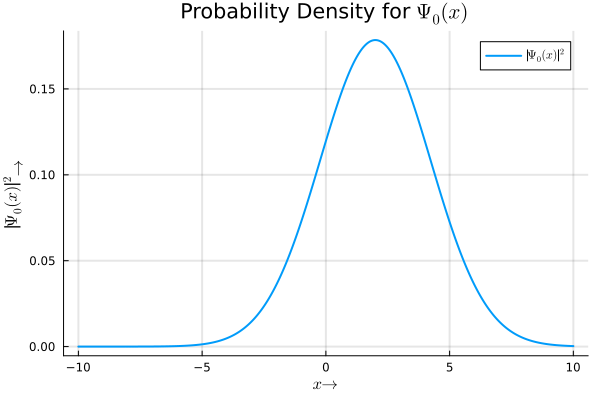

In [16]:

# Normalized Initital Wavefunction Ready !
init_wvfn = wvfn(x_in,R,x_0,p_0)./sqrt(quadgk(x -> exp(-2R*(x-x_0)^2),-L,L)[1]);

#println(init_wvfn[1:15]) # Uncomment to see the first 15 values of the initial wavefunction

# Plotting the initial wavefunction density at t=0
plot_density(x_in,init_wvfn, L"\Psi_{0}(x)")

### First Derivative

The first derivative is approximated using the following scheme: $$ \boxed{f^{\prime}(x) = \frac{f(x+a)-f(x-a)}{2a}} $$ where $a$ is the step size. At the end points, basic $\textnormal{\underline{linear interpolation}}$ is used, i.e, for example: $$ f^{\prime}(x_{2}) = \frac{f^{\prime}(x_{1})+f^{\prime}(x_{3})}{2} $$ $$ \implies f^{\prime}(x_{1}) = 2f^{\prime}(x_{2}) - f^{\prime}(x_{3}) $$

In [17]:
function first_derivative(wfval,a)

    fprime = zeros(ComplexF64,size(wfval))

    fprime[2:end-1] = (wfval[3:end] - wfval[1:end-2])./(2*a)
    fprime[1] = 2*fprime[2] - fprime[3]
    fprime[end] = 2*fprime[end-1] - fprime[end-2]

    return fprime
end;

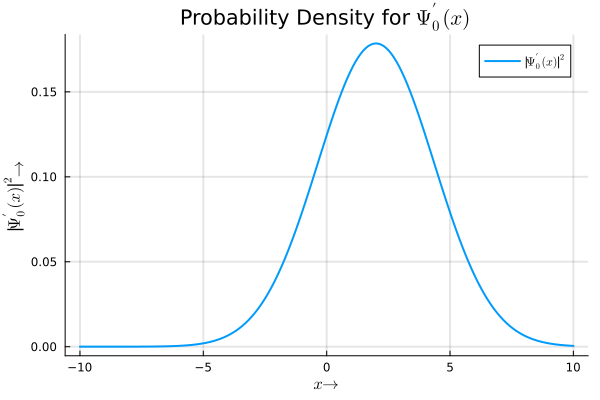

In [18]:
fd_psi = first_derivative(init_wvfn,a)

#println(fd_psi[1:15])

plot_density(x_in,fd_psi,L"Ψ_{0}^{′}(x)")

From the density plots of $\Psi_{0}(x)$ and $\Psi_{0}^{\prime}(x)$, there doesn't seem to be much difference. To quantify and check this we find the average difference in the values of the probability densities as: $$ \Bigg|\frac{1}{N} \sum_{i=1}^{N} (|\Psi_{0}(x_{i})|^2 - |\Psi_{0}^{\prime}(x_{i})|^2) \Bigg| $$

In [19]:
println("Mean absolute difference between wavefunction and its first derivative densities = ",abs(mean(abs2.(init_wvfn).-abs2.(fd_psi))))

Mean absolute difference between wavefunction and its first derivative densities = 0.002504239370236187


Thus, there is a visible difference, however since the resolution of the plot of probability densities is of the order $\approx 10^{-2}$ and that of the difference is $\approx 10^{-3}$, the plots look very similar.

### Second Derivative

The second derivative is calculated using the $(2r+1)$ point formula whose coefficients are obtained from the $\textit{table}$ function defined earlier. $\\$ Since a typical value of $r$ uses a total of $(2r+1)$ values of the wavefunction around the concerned point, some of the points located at the beginning and the end of the discretized grid will not get covered by the scheme. To be precise, only the $(N-2r)$ $\textnormal{\underline{middle-most}}$ points, i.e., in the range $(r+1)$ to $(N-r)$, both inclusive will be covered. The second derivatives for the remaining $2r$ points was calculated by decreasing the value of $r$. So, for example, for the points at positions $r$ and $(N-r+1)$, the value $r \rightarrow r-1$ was used to calculated the second derivative and so on. At the end points, interpolation was used as was done in the case of the first derivative.  

In [20]:
function second_derivative(wfval,a,r=1)
    fdprime = zeros(ComplexF64,size(wfval))
    r_in = 1:r
    coeff = table(r_in)
    N = length(wfval)
    for i in r_in
        for j in 1:length(coeff[i])
            if i<r
                if j==1
                    fdprime[i+1] += coeff[i][j]*wfval[i+1]
                    fdprime[N-i] += coeff[i][j]*wfval[N-i]

                else
                    fdprime[i+1] += coeff[i][j]*(wfval[i-j+2] + wfval[i+j])
                    fdprime[N-i] += coeff[i][j]*(wfval[N-i-j+1] + wfval[N-i+j-1])
                end
        
            else
                if j==1
                    fdprime[i+1:N-i] += coeff[i][j]*wfval[i+1:N-i]
                else
                    fdprime[i+1:N-i] += coeff[i][j]*(wfval[i-j+2:N-i-j+1] + wfval[i+j:N-i+j-1])
                end
            end
        end
    end

    fdprime[1] = 2*fdprime[2] - fdprime[3]
    fdprime[end] = 2*fdprime[end-1] - fdprime[end-2]

    return fdprime

end;

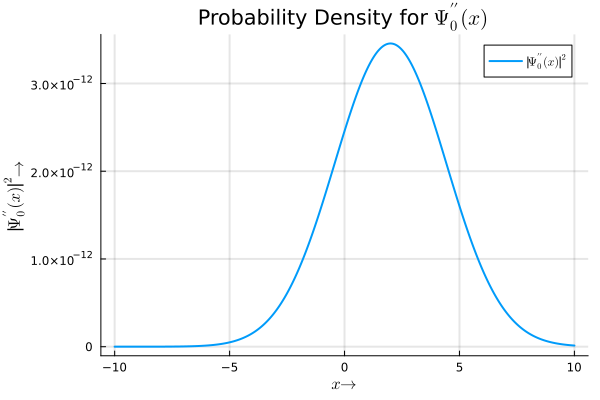

In [21]:
fdd_psi = second_derivative(init_wvfn,a,r);

#print(fdd_psi[1:20])

plot_density(x_in,fdd_psi,L"Ψ_{0}^{′′}(x)")

Again we see a similar shape that we saw previously for the wavefunction and its first derivative. However, this time, the order of the probability density has changed significantly. It is of the order $10^{-12}$ for the second derivative, whereas it was of the order $10^{-2}$ for the wavefunction and its first derivative.

In [22]:
println("Mean absolute difference between wavefunction and its second derivative densities = ",abs(mean(abs2.(init_wvfn).-abs2.(fdd_psi))))
println("Mean absolute difference between the first and second derivative densities = ",abs(mean(abs2.(fd_psi).-abs2.(fdd_psi))))

Mean absolute difference between wavefunction and its second derivative densities = 0.049995014820701913
Mean absolute difference between the first and second derivative densities = 0.05249925419093809


As can be seen clearly, the mean absolute differences are of the order $10^{-2} \gg 10^{-12}$.

### Discretizing Time

In [23]:
T = 100 # Time range
N_t = 10^3 # Time steps
delta_t = T/N_t; # Step size

### Solving the Problem!
The function described below returns the matrix $A$ which is used to solve the problem as described in the paper: $$ A\Psi_{n+1} = A^{*}\Psi_{n} $$

In [24]:
function A_matrix(a_kr, d_j, N)

    A_mat = spzeros(N,N)
    a_vec = a_kr[2:end]
    for i in 1:length(a_vec)
        A_mat += spdiagm(-i => a_vec[i]*ones(ComplexF64,N-i),i => a_vec[i]*ones(ComplexF64,N-i))
    end
    A_mat += spdiagm(0 => d_j)

    return A_mat
    
end;

### Free Particle Solution

In [25]:
b_fp = 1im*delta_t/(a^2)
a_fp = -0.5*b_fp.*table(r)[1]
d_fp = (1 + a_fp[1])*ones(ComplexF64,N);

In [26]:
A_fp = A_matrix(a_fp,d_fp,N);

In [27]:
psi_fp_solve_t = solve_wvfn(init_wvfn, A_fp, N_t);

┌ Info: Saved animation to c:\Users\Computing\Documents\PYL800 Julia\Free Particle.gif
└ @ Plots C:\Users\Computing\.julia\packages\Plots\QZRtR\src\animation.jl:156


Plots.AnimatedGif("c:\\Users\\Computing\\Documents\\PYL800 Julia\\Free Particle.gif")
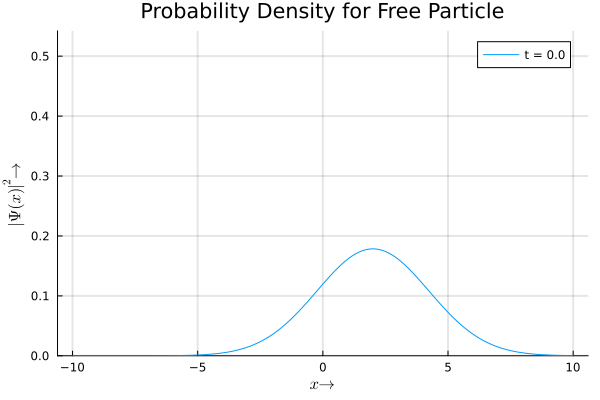

In [28]:
plot_solution(x_in,psi_fp_solve_t,T,"Free Particle",10)

### Harmonic Oscillator

Apart from the usual assumptions about the values of $m$ and $\hbar$, we further assume $\omega = 1$ which gives $k = 0.5$.

In [29]:
V_ho = potential(x_in,0.5)
b_ho = 1im*delta_t/(a^2)
a_ho = -0.5*b_ho.*table(r)[1]
d_ho = ((1 + a_ho[1]).+(0.5*1im*delta_t*V_ho))[:,1];

In [30]:
A_ho = A_matrix(a_ho,d_ho,N);

In [31]:
psi_ho_solve_t = solve_wvfn(init_wvfn, A_ho, N_t);

┌ Info: Saved animation to c:\Users\Computing\Documents\PYL800 Julia\Harmonic Oscillator.gif
└ @ Plots C:\Users\Computing\.julia\packages\Plots\QZRtR\src\animation.jl:156


Plots.AnimatedGif("c:\\Users\\Computing\\Documents\\PYL800 Julia\\Harmonic Oscillator.gif")
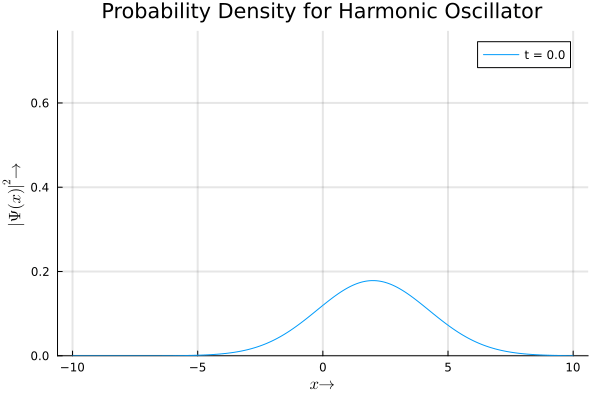

In [32]:
plot_solution(x_in,psi_ho_solve_t,T,"Harmonic Oscillator",10)

### Is Time Evolution normalized?

We check the normalization for both the solutions!

In [33]:
check_norm(psi_fp_solve_t,a)

1001-element Vector{Float64}:
 0.9999002964349594
 0.9999002964346505
 0.9999002964343517
 0.9999002964344404
 0.9999002964341196
 0.9999002964339099
 0.9999002964337933
 0.9999002964335594
 0.9999002964336863
 0.9999002964337226
 ⋮
 0.999900296310053
 0.9999002963099296
 0.9999002963100386
 0.9999002963100456
 0.999900296309811
 0.9999002963098212
 0.9999002963096164
 0.9999002963096978
 0.9999002963095072

In [34]:
check_norm(psi_ho_solve_t,a)

1001-element Vector{Float64}:
 0.9999002964349594
 0.9999002964349466
 0.99990029643509
 0.9999002964352168
 0.9999002964352707
 0.9999002964353649
 0.9999002964352369
 0.9999002964353543
 0.9999002964353604
 0.9999002964352508
 ⋮
 0.9999002964351915
 0.9999002964351716
 0.9999002964351305
 0.9999002964351473
 0.9999002964351095
 0.9999002964350282
 0.9999002964350268
 0.9999002964350584
 0.9999002964350382

As can be seen, both the solutions are normalized at all times. This is because the time evolution operator is $\textbf{Unitary}$ which preserves the norm and hence, the probability.

## Uncertainties ?

To find out the uncertainties, we made the following approximations: $$ \langle x \rangle = \int_{}^{} x|\Psi(x)|^2 dx \approx \sum_{i}^{} x_{i}|\Psi(x_{i})|^2 a $$ $$ \langle x^2 \rangle = \int_{}^{} x^2|\Psi(x)|^2 dx \approx \sum_{i}^{} x_{i}^2|\Psi(x_{i})|^2 a $$ $$ \langle p \rangle = -i \int_{}^{} \Psi^{*}(x)\Psi^{\prime}(x) dx \approx -i \sum_{i}^{} \Psi^{*}(x_i)\Psi^{\prime}(x_i) a $$ $$ \langle p^2 \rangle = - \int_{}^{} \Psi^{*}(x)\Psi^{\prime\prime}(x) dx \approx - \sum_{i}^{} \Psi^{*}(x_i)\Psi^{\prime\prime}(x_i) a $$ Due to numerical errors among other things, we do get a complex expectation value for both $p$ and $p^2$. To quantify the uncertainty in $p$, i.e. $\sigma_{p}$, we work with its absolute value in the following analysis.

In [35]:
# Returns uncertainty at a particular instant of time
function uncertainties(x_in,psi_solution,a,t=1)
    wvfn = psi_solution[:,t]

    exp_x = a*sum(x_in.*abs2.(wvfn))
    exp_x2 = a*sum((x_in.^2).*abs2.(wvfn))

    exp_p = -1im*a*sum(conj(wvfn).*first_derivative(wvfn,a))
    exp_p2 = -a*sum(conj(wvfn).*second_derivative(wvfn,a))

    unc_x = sqrt(exp_x2 - (exp_x^2))
    unc_p = sqrt(exp_p2 - (exp_p^2))

    prod_unc = unc_x*unc_p
    return [unc_x, unc_p]
end

# Returns uncertainties as a function of time; columns (1,2) => uncertainties(t) (x,p)
function uncertainties_t(x_in,psi_solution,a)
    t_stamps = size(psi_solution)[2]
    unc_vals = zeros(ComplexF64,(t_stamps,2))
    for i in 1:t_stamps
        unc_vals[i,:] = uncertainties(x_in,psi_solution,a,i)
    end    
    return unc_vals
end

# Plotting Uncertainties as a function of time
function plot_uncert(unc_mat, delta_t, potential::String)
    time_upper = size(unc_mat)[1]
    unc_xt = abs.(unc_mat[:,1])
    unc_pt = abs.(unc_mat[:,2])
    unc_prod = unc_xt.*unc_pt
    t_vals = zeros(time_upper)
    for i in 2:time_upper
        t_vals[i] = (i-1)*delta_t
    end    
    plot(t_vals,unc_xt,label=L"σ_{x}(t)",xlabel=L"t →", ylabel="Uncertainties", gridlinewidth=2)
    plot!(t_vals,unc_pt,label=L"σ_{p}(t)")
    plot!(t_vals,unc_prod,label=L"σ_{x}(t)σ_{p}(t)")
    plot!(t_vals,0.5*ones(time_upper),label=L"y=\frac{1}{2}")
    title!("Uncertainties v/s Time for $potential")
end

plot_uncert (generic function with 1 method)

In [36]:
unc_mat_fp = uncertainties_t(x_in,psi_fp_solve_t,a);

In [37]:
unc_mat_ho = uncertainties_t(x_in,psi_ho_solve_t,a);

#### Plotting the Uncertainties

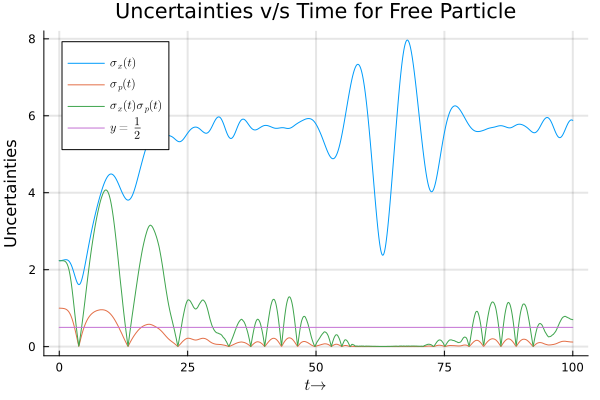

In [38]:
plot_uncert(unc_mat_fp,delta_t,"Free Particle")

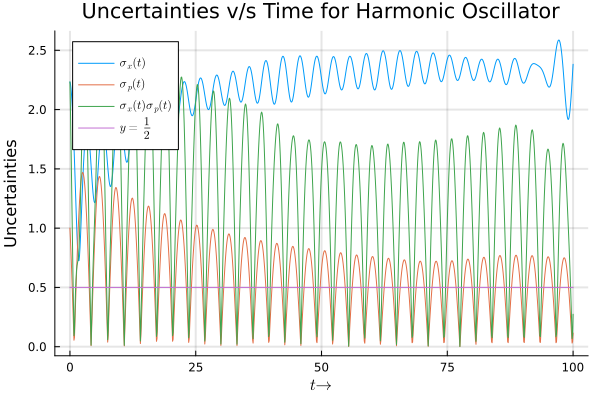

In [39]:
plot_uncert(unc_mat_ho,delta_t,"Harmonic Oscillator")

In both the cases, we observe the violation of Heisenberg's Uncertainty Principle at certain instants of time.

#### Statistics of Uncertainty?
We check whether on average is there a violation of the Uncertainty Principle:

In [40]:
fp_uncert_princ_test = mean(abs.(unc_mat_fp[:,1]).*abs.(unc_mat_fp[:,2]))
ho_uncert_princ_test = mean(abs.(unc_mat_ho[:,1]).*abs.(unc_mat_ho[:,2]))

println("Average product of Uncertainties for Free Particle = ",fp_uncert_princ_test)
println("Average product of Uncertainties for Harmonic Oscillator = ",ho_uncert_princ_test)

Average product of Uncertainties for Free Particle = 0.7902326113892766
Average product of Uncertainties for Harmonic Oscillator = 1.2272443563441928


Hence, on average, our analysis does follow the Heisenberg's Uncertainty Principle. The verification will become more authentic with large number of samples that is for longer duration of time!